# OFF TO EUROPE!! HERE ARE FEW THINGS YOU MIGHT WANNA KNOW!!

Please use the provided dataset in part 1 along with a visualization framework of your choice (Plotly,
matplotlib, D3.js) to produce some quality visualizations and documentation. Please feel free to share this in
any format you choose that enables us to view it optimally (jupyter notebook, webpage, pdf etc). Please
remember to upload the code used to generate the visuals to Github and share it with us for your work to be
considered.

- <b>Hotel_Address:</b> Address of hotel.
- <b>Review_Date:</b> Date when reviewer posted the corresponding review.
- <b>Average_Score:</b> Average Score of the hotel, calculated based on the latest comment in the last year.
- <b>Hotel_Name:</b> Name of Hotel
- <b>Reviewer_Nationality:</b> Nationality of Reviewer
- <b>Negative_Review:</b> Negative Review the reviewer gave to the hotel. If the reviewer does not give the negative review, then it should be: 'No Negative'
- <b>Review_Total_Negative_Word_Counts:</b> Total number of words in the negative review.
- <b>Positive_Review:</b> Positive Review the reviewer gave to the hotel. If the reviewer does not give the negative review, then it should be: 'No Positive'
- <b>Review_Total_Positive_Word_Counts:</b> Total number of words in the positive review.
- <b>Reviewer_Score:</b> Score the reviewer has given to the hotel, based on his/her experience
- <b>Total_Number_of_Reviews_Reviewer_Has_Given:</b> Number of Reviews the reviewers has given in the past.
- <b>Total_Number_of_Reviews:</b> Total number of valid reviews the hotel has.
- <b>Tags:</b> Tags reviewer gave the hotel.
- <b>days_since_review:</b> Duration between the review date and scrape date.
- <b>Additional_Number_of_Scoring:</b> There are also some guests who just made a scoring on the service rather than a review. This number indicates how many valid scores without review in there.
- <b>lat:</b> Latitude of the hotel
- <b>lng:</b> longtitude of the hotel               

In [20]:
import warnings
warnings.filterwarnings('ignore')

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
from wordcloud import WordCloud

In [2]:
hotel = pd.read_csv('Hotel_Reviews.csv')

In [3]:
hotel.head(2)

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968


In [4]:
prof = ProfileReport(hotel)
prof.to_file(output_file='output.html')

Summarize dataset:   0%|          | 0/30 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
prof

The Data Statistics says we have 526 Duplicate rows. Also, except for Lant and Long, none of the columns have missing values. 

In [6]:
print(hotel.duplicated().sum())
hotel = hotel.drop_duplicates()
hotel = hotel.reset_index(drop=True)
print(hotel.duplicated().sum())

526
0


Now, starting with visulaizations

In [7]:
hotel.head(3)

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficul...,42,1403,Location was good and staff were ok It is cut...,21,9,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968


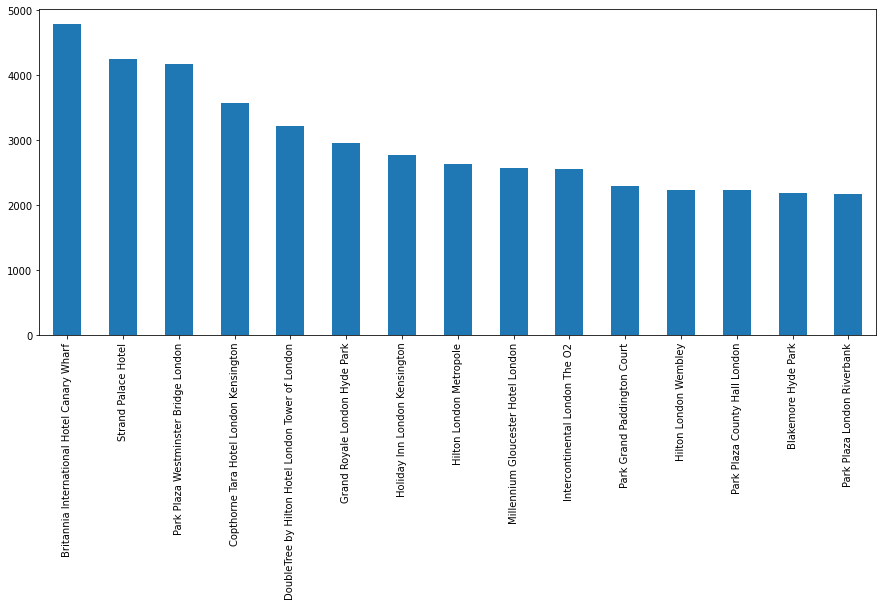

In [8]:
plt.figure(figsize=[15,6])
hotel.Hotel_Name.value_counts().head(15).plot(kind='bar');

**1. The above graph shows the top 15 most reviewed hotel in Europe**

In [143]:
avg_score = hotel[['Hotel_Name','Average_Score']].drop_duplicates()
avg_score = avg_score.reset_index()
avg_score

,Hotel_Name,Average_Score
0,Ritz Paris,9.8
1,H tel de La Tamise Esprit de France,9.6
2,Hotel The Serras,9.6
3,H10 Casa Mimosa 4 Sup,9.6
4,Haymarket Hotel,9.6
5,41,9.6
6,Hotel Casa Camper,9.6
7,Hotel The Peninsula Paris,9.5
8,Le Narcisse Blanc Spa,9.5
9,Hotel Sacher Wien,9.5


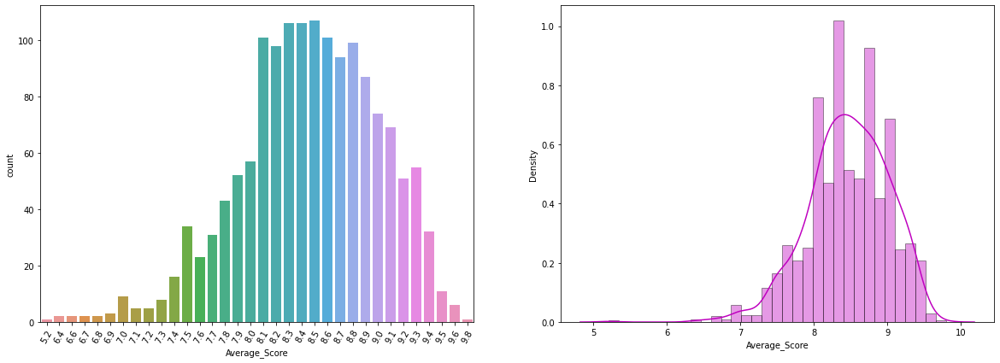

In [51]:
plt.figure(figsize=[20,15])
plt.subplot(2, 2, 1)
sns.countplot(avg_score.Average_Score);
plt.xticks(rotation=60);


plt.subplot(2, 2, 2)
sns.distplot(avg_score.Average_Score, color = 'm',hist_kws={'edgecolor':'black'});

**2. From the above graph, we can see that the average score for most of the hotels lie between 8.1 to 8.8**

In [10]:
top_10 = pd.DataFrame(hotel.Hotel_Name.value_counts().head(15).index.to_list(),columns=['Hotel'])

top_10['Avg_Score'] = ''
for i in range(len(top_10.Hotel)):
    top_10['Avg_Score'][i]=hotel.Average_Score[hotel.Hotel_Name==top_10.Hotel[i]].max()

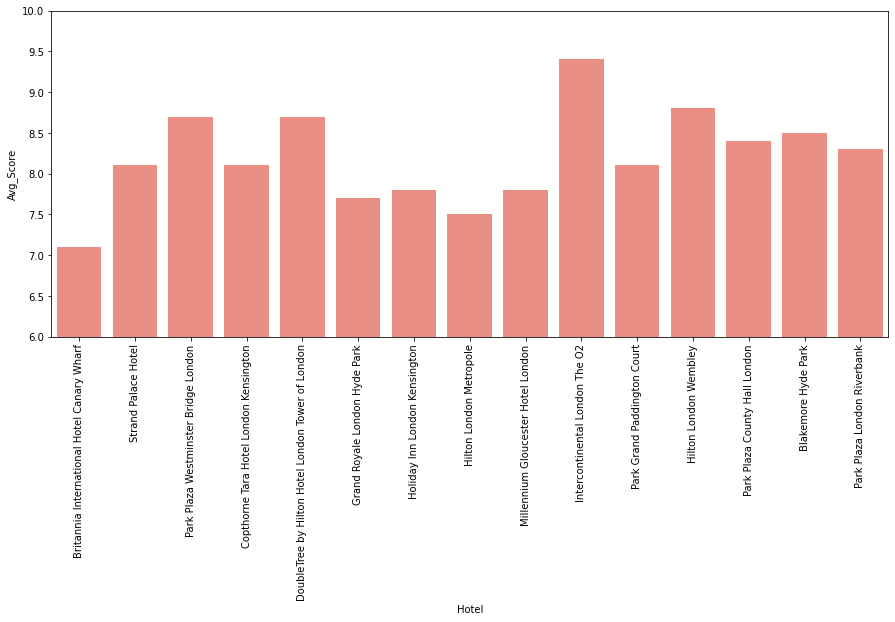

In [21]:
plt.figure(figsize=[15,6])
sns.barplot(top_10.Hotel,top_10.Avg_Score,color="salmon");
plt.ylim(6,10)
plt.xticks(rotation=90);

**3. The above graph shows the average scores scored by the top 15 most reviewed hotels.**

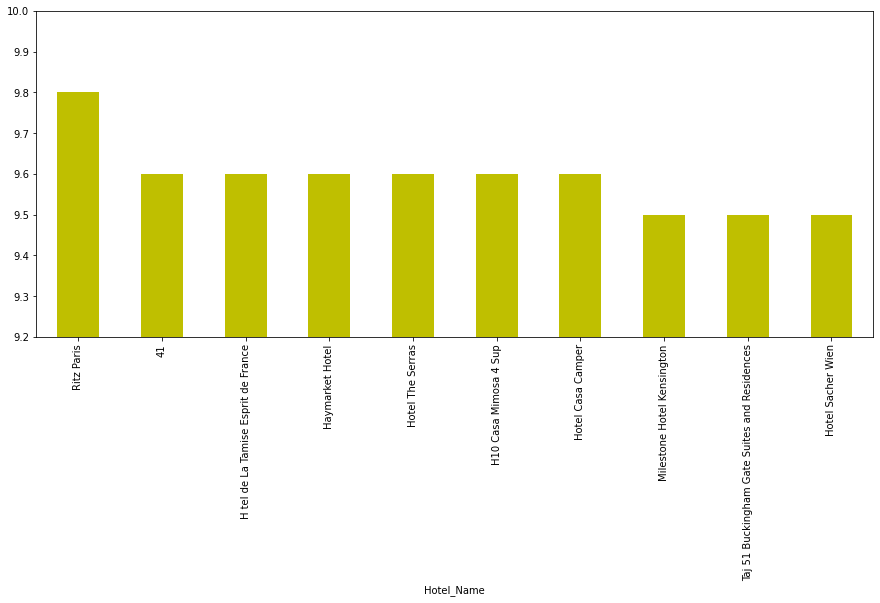

In [56]:
plt.figure(figsize=[15,6])
plt.ylim(9.2,10)
hotel.groupby('Hotel_Name')['Average_Score'].first().sort_values(ascending=False).head(10).plot(kind='bar',color='y');

**4. The above graph shows the top 10 hotels with maximum Average Scoring**

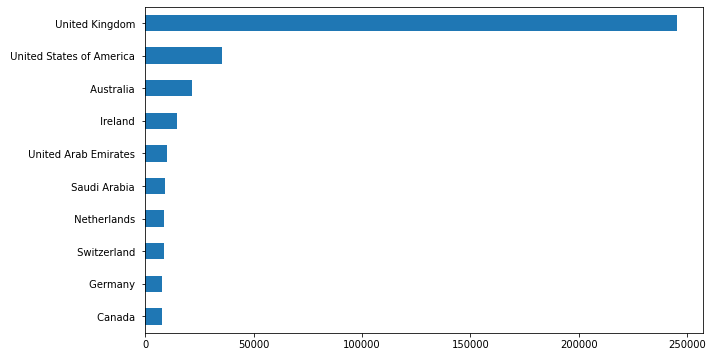

In [88]:
plt.figure(figsize=[10,6])
hotel['Reviewer_Nationality'].value_counts().sort_values().tail(10).plot.barh();

**5. The above garph says from which country more reviews were given.**

In [206]:
sample_hotel = hotel.sample(n = 30000)
sample_hotel = sample_hotel.reset_index(drop=True)

In [124]:
text_pos = ""
for i in range(sample_hotel.shape[0]):
    text_pos = " ".join([text_pos,sample_hotel["Positive_Review"].values[i]])

In [125]:
text_nev = ""
for i in range(sample_hotel.shape[0]):
    text_nev = " ".join([text_nev,sample_hotel["Negative_Review"].values[i]])

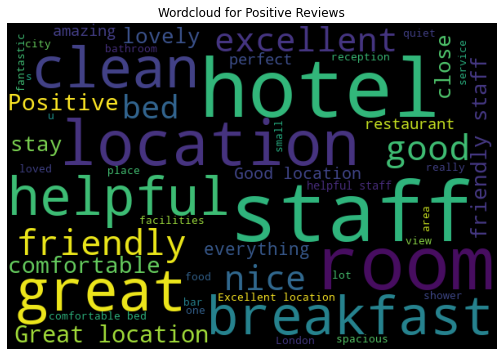

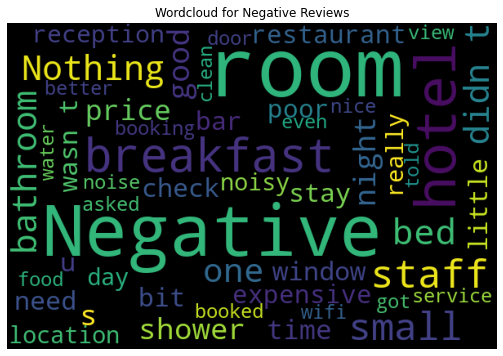

In [136]:

wordcloud = WordCloud(background_color='black', width = 600,\
                      height=400, max_font_size=100, max_words=50).generate(text_pos)
wordcloud.recolor(random_state=312)
plt.figure(figsize=[15,6])
plt.imshow(wordcloud)
plt.title("Wordcloud for Positive Reviews")
plt.axis("off")
plt.show()


wordcloud = WordCloud(background_color='black', width = 600,\
                      height=400, max_font_size=100, max_words=50).generate(text_nev)
wordcloud.recolor(random_state=312)
plt.figure(figsize=[15,6])
plt.imshow(wordcloud)
plt.title("Wordcloud for Negative Reviews")
plt.axis("off")
plt.show()

**6. The above word cloud shows the most frequent words used in positive and negative reviews (based on sample data).**

In [157]:
hotel_country = hotel[['Hotel_Name','Hotel_Address','lat','lng']].drop_duplicates()
hotel_country = hotel_country.dropna()
hotel_country.reset_index(drop=True,inplace=True)

In [158]:
hotel_country['Country'] = ''
for i in range(len(hotel_country.Hotel_Address)):
    word_list = hotel_country.Hotel_Address[i].split()
    hotel_country['Country'][i] = word_list[-1]

In [159]:
hotel_country.Country[hotel_country.Country=='Kingdom'] = 'United Kingdom'

In [162]:
import folium
from folium.plugins import MarkerCluster

In [165]:
world_map= folium.Map(tiles="cartodbpositron")
marker_cluster = MarkerCluster().add_to(world_map)

In [189]:
for i in range(len(hotel_country)):
        lat = hotel_country.iloc[i]['lat']
        long = hotel_country.iloc[i]['lng']
        radius=5
        popup_text = """Country : {}<br>"""
        popup_text = popup_text.format(hotel_country.iloc[i]['Country'])
                                                                     
        folium.CircleMarker(location = [lat, long], radius=radius, popup= popup_text, fill =True).add_to(marker_cluster)

In [242]:
world_map

**7. The above map shows the location of hotels country wise based on radius, latitude and longitude.**

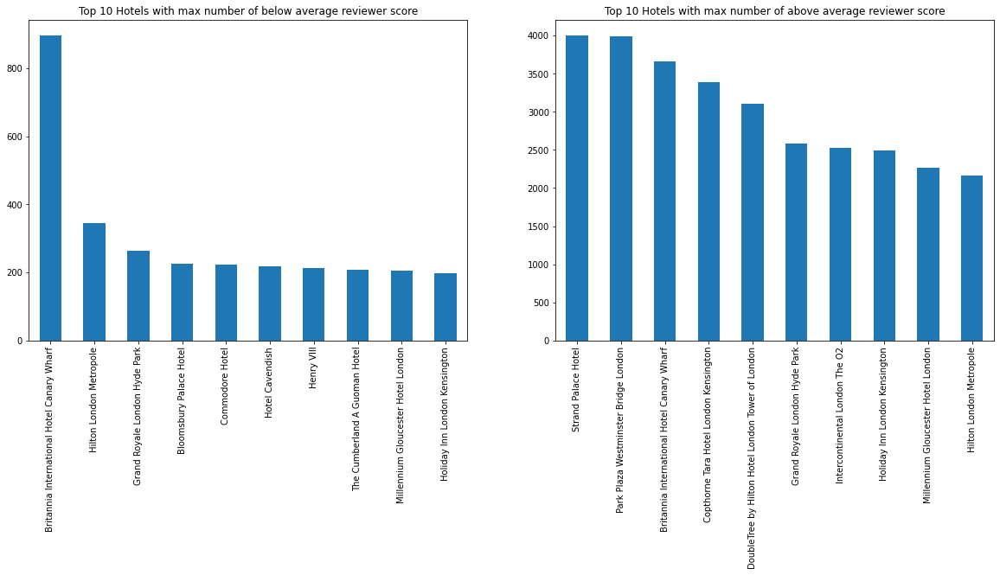

In [203]:
plt.figure(figsize=[20,15])
plt.subplot(2, 2, 1)
hotel.Hotel_Name[hotel.Reviewer_Score < 5].value_counts().head(10).plot(kind='bar');
plt.title('Top 10 Hotels with max number of below average reviewer score');

plt.subplot(2, 2, 2)
hotel.Hotel_Name[hotel.Reviewer_Score > 5].value_counts().head(10).plot(kind='bar');
plt.title('Top 10 Hotels with max number of above average reviewer score');

**8. The above graph provides the hotels with below and above average reviewer scores.**

In [209]:
sample_hotel['Trip'] = ''
for i in range(len(sample_hotel.Tags)):
    word_list = sample_hotel.Tags[i].split(',')
    sample_hotel.Trip[i] = (word_list[0])

In [226]:
sample_hotel['L/B trip'] = ''
for i in range(len(sample_hotel.Trip)):
    if 'Solo traveler' in sample_hotel.Trip[i]:
        sample_hotel['L/B trip'][i] = 'Business Trip'
    elif 'Business trip' in sample_hotel.Trip[i]:
        sample_hotel['L/B trip'][i] = 'Business Trip'
    else:
        sample_hotel['L/B trip'][i] = 'Leisure Trip'

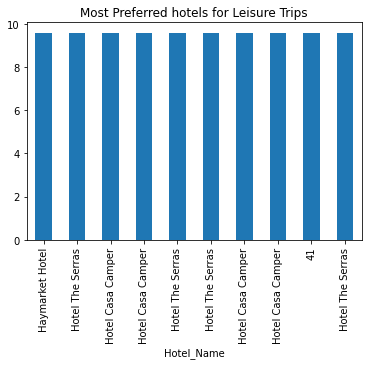

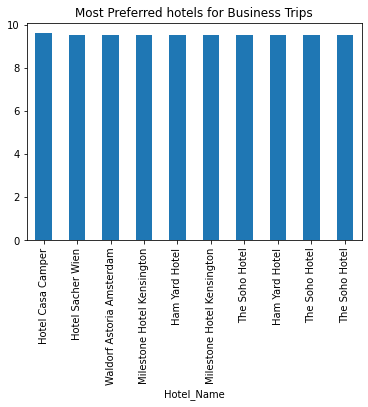

In [267]:
sample_hotel[sample_hotel['L/B trip']=='Leisure Trip'].sort_values(by='Average_Score',ascending=False).head(10).plot(kind='bar',x='Hotel_Name',y='Average_Score',legend=None);
plt.title('Most Preferred hotels for Leisure Trips');


sample_hotel[sample_hotel['L/B trip']=='Business Trip'].sort_values(by='Average_Score',ascending=False).head(10).plot(kind='bar',x='Hotel_Name',y='Average_Score',legend=None);
plt.title('Most Preferred hotels for Business Trips');

**9. The above graph provides the most preferred hotels for Business and Leisure trips based on the average score**